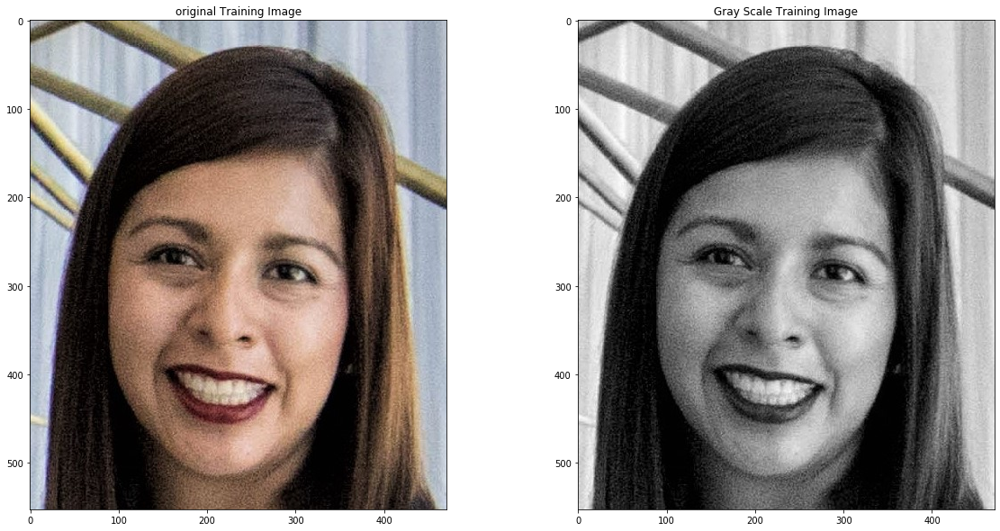

In [4]:
#Loading images and import reaources
%matplotlib inline

import cv2
import matplotlib.pyplot as plt

#see the default figure size
plt.rcParams['figure.figsize'] = [20, 10]

#load the training image
image = cv2.imread('./images/face.jpeg')

#convert the training image to RGB
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#Display the images
plt.subplot(121)
plt.title('original Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Gray Scale Training Image')
plt.imshow(training_gray, cmap = 'gray')
plt.show()

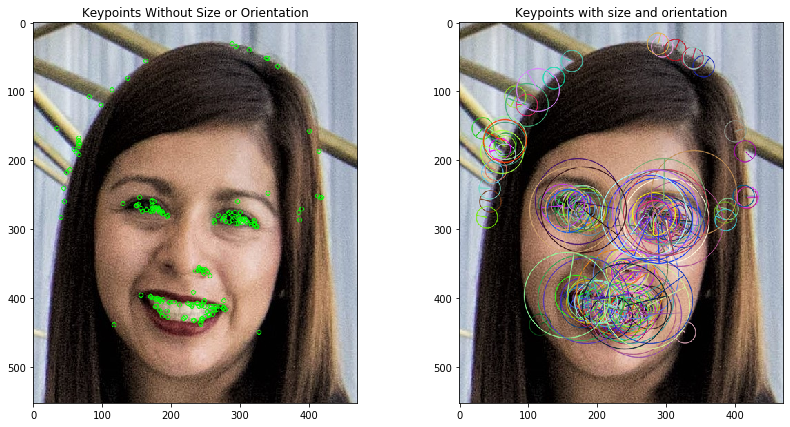


Number of keypoints detected:  175


In [5]:
#Locating keypoint
#import copy to make copies of training image
import copy

#set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

#set the parameters of ORB algorithm by specifying the maximum number of keypoints to locate
#and the pyramid decimation ratio
orb = cv2.ORB_create(200, 2.0)

#find the keypoints in the gray scale training image and compute their ORB descriptor
#The None parameter is needed to indicate that we are not using a mask
keypoints, descriptor = orb.detectAndCompute(training_gray, None)

#create copies of the training image to draw our kaypoints on
keyp_without_size = copy.copy(training_image)
keyp_with_size = copy.copy(training_image)

#draw the keypoints without size or orientation on one copy of the training image
cv2.drawKeypoints(training_image, keypoints, keyp_without_size, color = (0, 255, 0))

#draw the keypoint with size and orientation on the other copy of the training image
cv2.drawKeypoints(training_image, keypoints, keyp_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the image with the keypoints without size or orientation
plt.subplot(121)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_without_size)

#display the image with the keypoints with size and orientation
plt.subplot(122)
plt.title('Keypoints with size and orientation')
plt.imshow(keyp_with_size)
plt.show()

print("\nNumber of keypoints detected: ", len(keypoints))

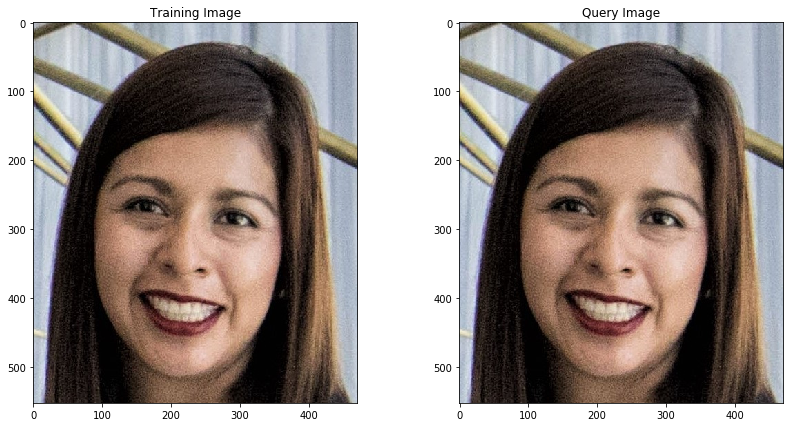

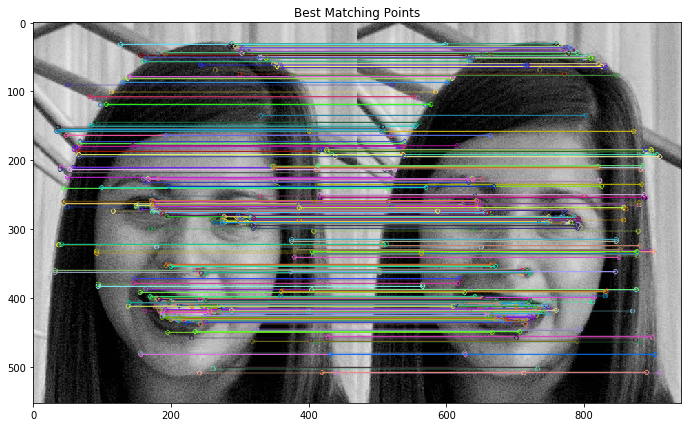

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  821

Number of Matching Keypoints Between The Training and Query Images:  821


In [6]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/face.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 300 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

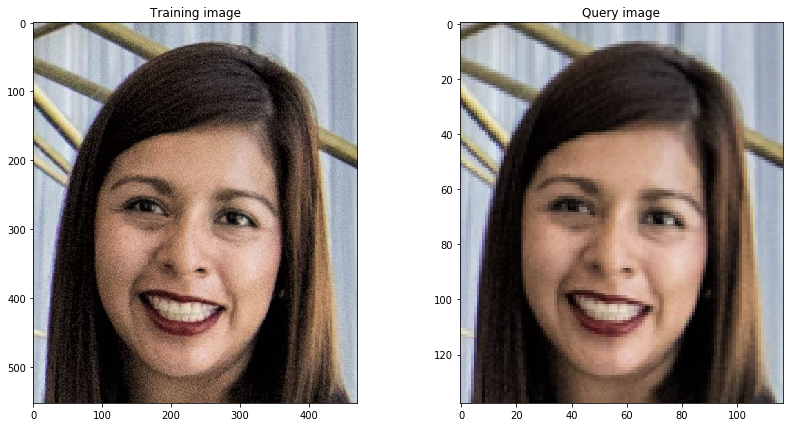

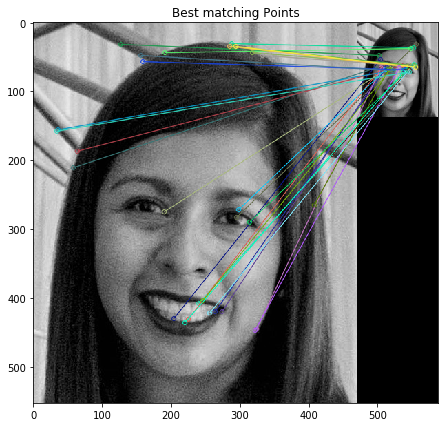


 The training image has shape:  (553, 471)
The query image has shape:  (138, 117)

 Number og keypoints detected in the training image:  821

 Number og keypoints detected in the query image:  65

 Number of matching keypoints between the training and query images:  821


In [7]:
#ORB's main properties(scle invariance / rotational invariance
#/ illumination invariace / Noise invariance)

###Scale invariance###
import cv2
import matplotlib.pyplot as plt

#set the defauslt figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

#load the training image
image1 = cv2.imread('./images/face.jpeg')

#load the query image
image2 = cv2.imread('./images/faceQS.png')

#convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

#convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#display the images
plt.subplot(121)
plt.title('Training image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query image')
plt.imshow(query_image)
plt.show()

#convert the training image to grgay scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

#set the parameters of the ORB algorithm by specifying the maximum number og keypoints
#to locate and the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

#""find the keypoints"" in the gray scale training and query image and computer their ORB descriptor.
# the none parameter is needed to indicate that we are not using a mask in either case
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptor_query = orb.detectAndCompute(query_gray, None)

#create a Brute Force Matcher object. Set crosscheck to True so that BFMatcher will only return sonsistent.
#pairs. Such technique usually produces best result with minimal number of outliers when there sre enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# perform the matching between the orb descriptors of the traiing image and query image
matches = bf.match(descriptors_train, descriptors_query)

#The matches with shorter distance are the ones we want. So we sort the matches according to distance.
matches = sorted(matches, key = lambda x : x.distance)

#connect the keypoinys in the training image with theirbest matching keypoints in the query image.
#The best matches correspond to the first elements in the sorted matches list, with the shorter distance.
# we draw the first 30 matches and use flags = 2 to plot thr matching keypoints
#without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:30], query_gray, flags = 2)

#display the best matching points
plt.title('Best matching Points')
plt.imshow(result)
plt.show()

#print the shape of the training image
print('\n The training image has shape: ', training_gray.shape)
#print the shape of the query image
print('The query image has shape: ', query_gray.shape)

#print the number of keypoints detected in the training image
print('\n Number og keypoints detected in the training image: ', len(keypoints_train))
#print the number of keypoints detected in the query image
print('\n Number og keypoints detected in the query image: ', len(keypoints_query))
#print the total number of matching points between the training and query image
print('\n Number of matching keypoints between the training and query images: ', len(matches))

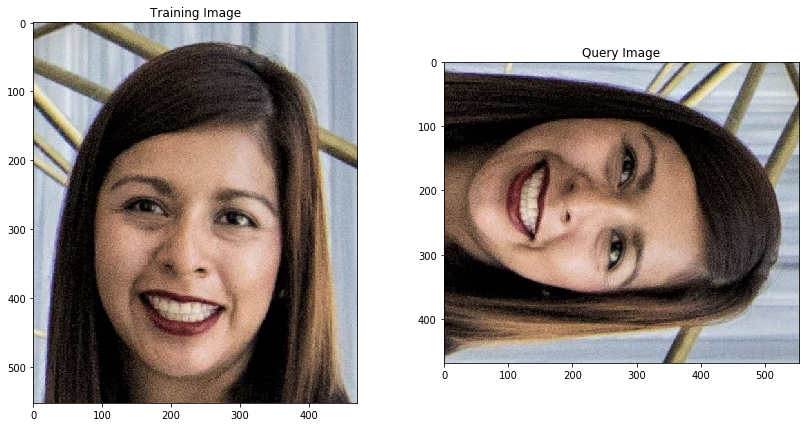

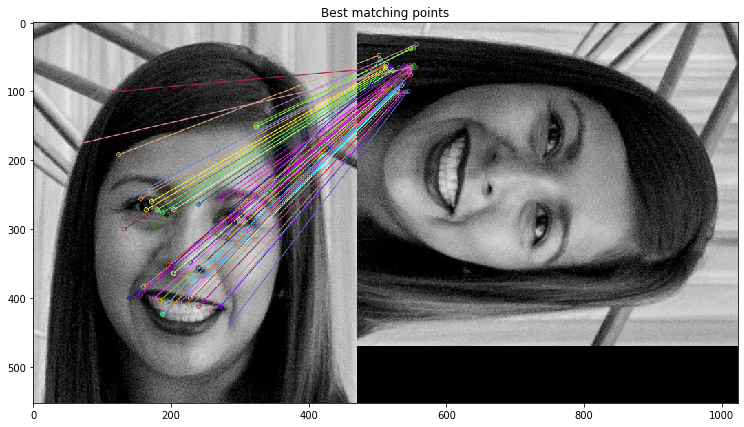


 Number of keypoints detected in the training image: 821

 Number of keypoints detected in the query image:  65

 Number of matching keypoints between the training and query images:  58


In [8]:
###Rotational invariance : it is able to detect objects in images regardless of their orientation.###
import cv2
import matplotlib.pyplot as plt

#set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

#load the training image
image1 = cv2.imread('./images/face.jpeg')
#load the query image
image2 = cv2.imread('./images/faceR.jpeg')

#convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
#convert the query image to BGR
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


#convert the training image to gray scale
trainng_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
#convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


#set the parameters of the orb algorithm
orb = cv2.ORB_create(1000, 2.0)

# ""Find the keypoints "" in the gray scale training and query images and compute their ORB descriptor.
keypoints_train, descriptor_train = orb.detectAndCompute(training_gray, None)
keypoints_gray, descriptor_gray = orb.detectAndCompute(query_gray, None)

# ""Create a Brute Force Matcher object"".
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
# ""Perform the matching"" between the ORB descriptors of the training image and the query image
matches = bf.match(descriptor_train, descriptor_query)

#the matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

# ""Connect the keypoints"" in the training image with their best matching keypoints in the query image.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)



#Display the best matching points
plt.title('Best matching points')
plt.imshow(result)
plt.show()

print("\n Number of keypoints detected in the training image:", len(keypoints_train))
print("\n Number of keypoints detected in the query image: ", len(keypoints_query))
print("\n Number of matching keypoints between the training and query images: ", len(matches))




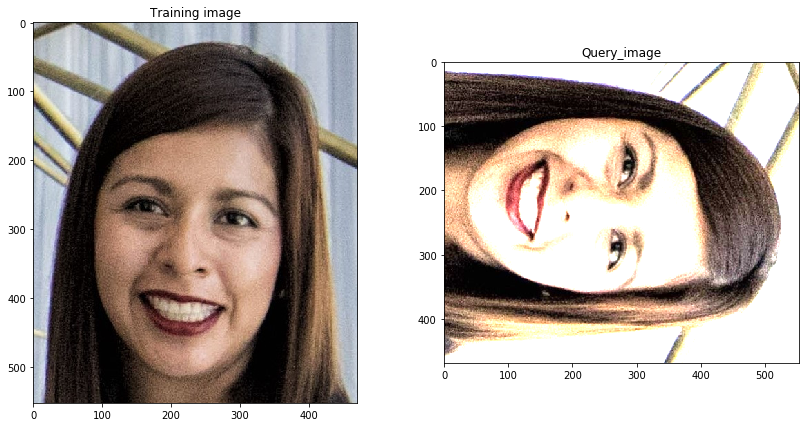

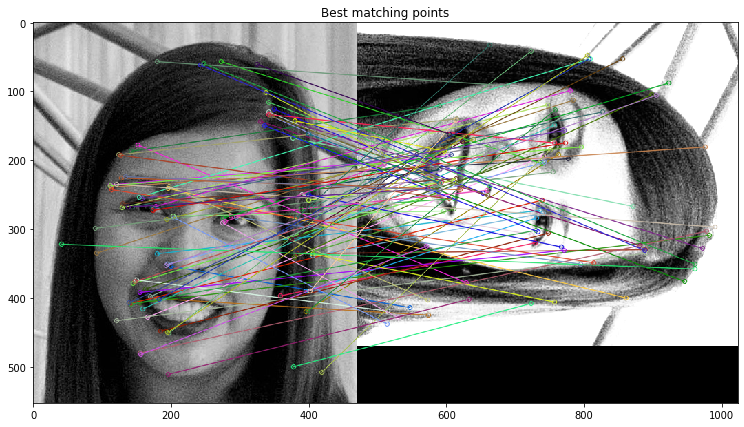


 Number of keypoints detected in the trainng image:  821

 Number of keypoints detected in the query image:  846

 Total number og matching keypoints between trainng and query image:  390


In [9]:
# illumination invariance

import cv2
import matplotlib.pyplot as plt

#set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

#load the training image
image1 = cv2.imread('./images/face.jpeg')
#load the query image
image2 = cv2.imread('./images/faceRI.png')

#convert te training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
#convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#display the images
plt.subplot(121)
plt.title('Training image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query_image')
plt.imshow(query_image)
plt.show()


#convert the training_image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
#convert the query_image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

#Find the keypoints
keypoints_train, descriptor_train = orb.detectAndCompute(trainng_gray, None)
keypoints_query, descriptor_query = orb.detectAndCompute(query_gray, None)


#create Brute force matcher obkect.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
#perform the matching between orb descriptor of trainng and query image
matches = bf.match(descriptor_train, descriptor_query)
#The matches with shoeter distance
matches = sorted(matches, key = lambda x : x.distance)

#connect the keypoints with their best match
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_gray, matches[:100], query_gray, flags = 2)


#display the best matching points
plt.title('Best matching points')
plt.imshow(result)
plt.show()

print("\n Number of keypoints detected in the trainng image: ", len(keypoints_train))
print("\n Number of keypoints detected in the query image: ", len(keypoints_query))
print("\n Total number og matching keypoints between trainng and query image: ", len(matches))


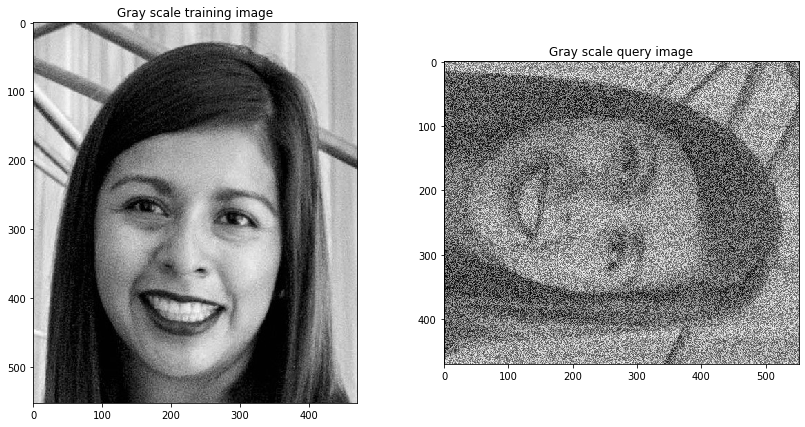

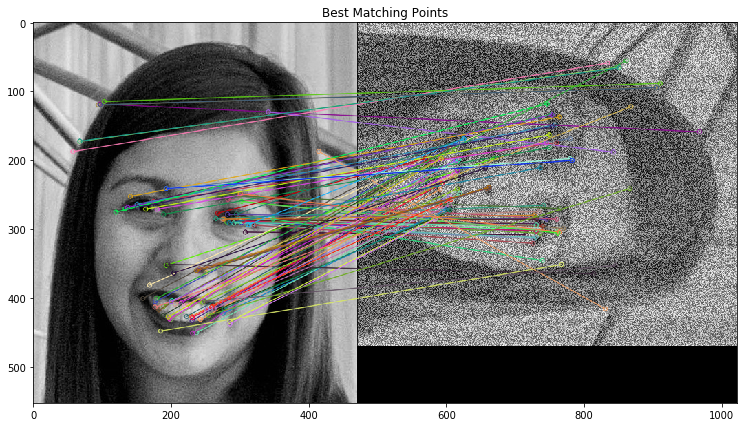

Number of Keypoints Detected In The Training Image:  888
Number of Keypoints Detected In The Query Image:  925

Number of Matching Keypoints Between The Training and Query Images:  253


In [12]:
#noise invariance
import cv2
import matplotlib.pyplot as plt

#set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

#load the training image
image1 = cv2.imread('./images/face.jpeg')
#load the noisy, gray scale query image
image2 = cv2.imread('./images/faceRN5.png')

#convert training image to gray
training_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
#convert query image to gray
query_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

#display the images
plt.subplot(121)
plt.title("Gray scale training image")
plt.imshow(training_gray, cmap = 'gray')
plt.subplot(122)
plt.title("Gray scale query image")
plt.imshow(query_gray, cmap = 'gray')
plt.show()

#set the parameters of ORB algorithm
#specifying the maximum number of keypoints, the pyramid decimation reatio
orb = cv2.ORB_create(1000, 1.3)

#find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(trainng_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

#create brute force matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
#perform matching between descriptor of the training and query image
matches = bf.match(descriptors_train, descriptors_query)
#The match with shorter distance
matches = sorted(matches, key = lambda x : x.distance)
#connect the keypoint with their best result
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)



# we display the image
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

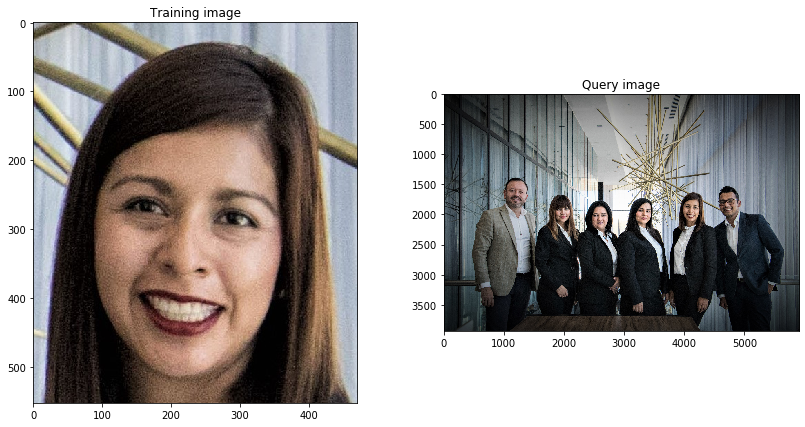

In [14]:
#object detection
import cv2
import matplotlib.pyplot as plt

#set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

#load the training image
image1 = cv2.imread('./images/face.jpeg')
#load the query image
image2 = cv2.imread('./images/Team.jpeg')

#convert the training image to rgb
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
#convert the query image to rgb
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#display the images
plt.subplot(121)
plt.title('Training image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query image')
plt.imshow(query_image)
plt.show()

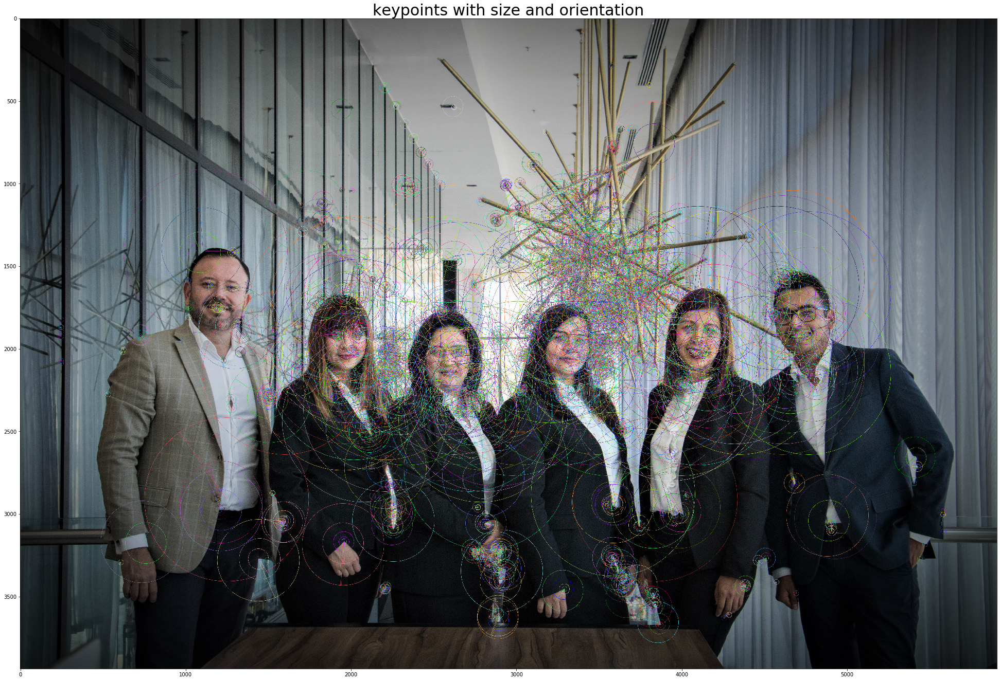


 Number of keypoints detected:  4941


In [20]:
#set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

#convert training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
#convert query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

#set the parameters of the ogb algorithm
orb = cv2.ORB_create(5000, 2.0)
#find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptor_query = orb.detectAndCompute(query_gray, None)

#create copies of the query images
query_image_keyp = copy.copy(query_image)

#draw the keypoints on the copy of query image
cv2.drawKeypoints(query_image, keypoints_query, query_image_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


#display
plt.title('keypoints with size and orientation', fontsize = 30)
plt.imshow(query_image_keyp)
plt.show()

print("\n Number of keypoints detected: ", len(keypoints_query))

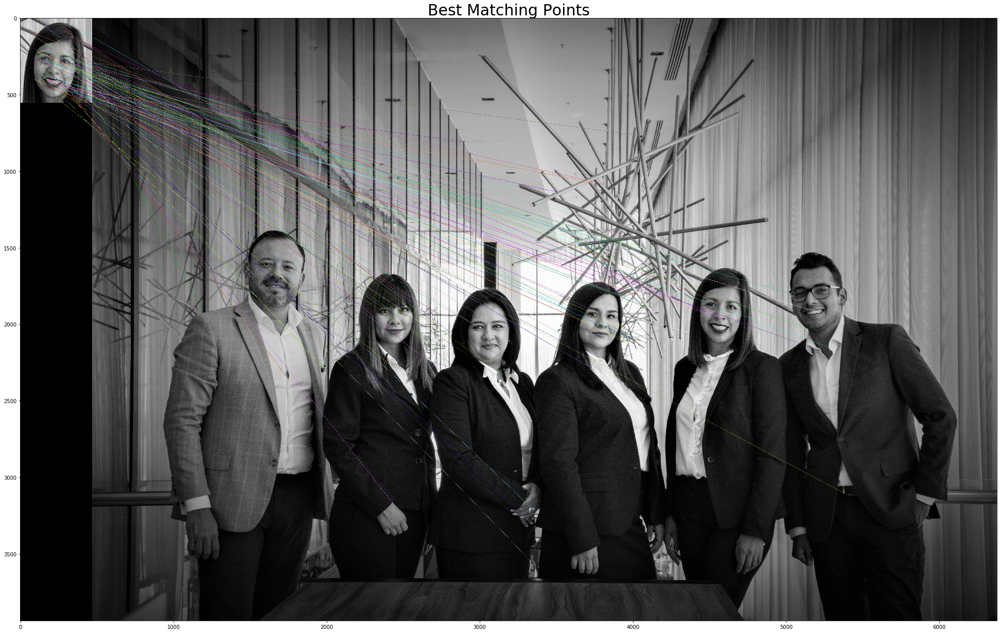

Number of Keypoints Detected In The Training Image:  2488
Number of Keypoints Detected In The Query Image:  4941

Number of Matching Keypoints Between The Training and Query Images:  352


In [22]:
# set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

#create brute force matcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
#perfor the matching
matches = bf.match(descriptors_train, descriptors_query)
#the matches with shorter distance
matches = sorted(matches, key = lambda x : x.distance)
#connect the keypoints
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:85], query_gray, flags = 2)


# we display the image
plt.title('Best Matching Points', fontsize = 30)
plt.imshow(result)
plt.show()




# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))
# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
# Print total number of matching Keypoints between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))